<a href="https://colab.research.google.com/github/Remaaa17/DL-Tasks/blob/main/Plant_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Load Data

In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'plant-village:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F414960%2F793497%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240718%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240718T211555Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D5deb1128077fb61b604a17213f0fe557578e21df7ed1eebe2daaa505bde479d94be0eb3a9e21920cbc5bad4d17a5928bbbe756cfb40ae34e366b11067bf5fbc2fa72d07fdb9a09874c892d7c6b531bbf66360f3f60fee8bcb145aa99c8c36d837a29ccf2dfd1691acc54cf5a3196539e586c55b703547125bafc32be4a53cc7c4418af0c498cb365516224db85e9cb3018a9ea5828af6ae274ece416f6e16fe459e510f917d1202671ff1bb770337edb47f8e0bb3d452ebeef912a0069e29667604091ead227462914121532d0f850b057510902af69c30d6d27ad4c4b7a7d2a03df1a0ba4a481a0ddb19c5b3110bf6a3909cb5c94ae05209537dbd72eb121b0'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 344488049 bytes downloaded
Downloaded and uncompressed: plant-village
Data source import complete.


In [ ]:
# import libraries
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np
import pathlib
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' # to disable all debugging logs

In [ ]:
# importing dataset
dir = os.listdir('../input/plant-village/PlantVillage')
for filenames in dir:
    print(filenames)

Tomato_Septoria_leaf_spot
Tomato_healthy
Tomato__Tomato_YellowLeaf__Curl_Virus
Tomato_Leaf_Mold
Pepper__bell___healthy
Pepper__bell___Bacterial_spot
Potato___Early_blight
Tomato__Target_Spot
Tomato_Bacterial_spot
Potato___Late_blight
Tomato__Tomato_mosaic_virus
Tomato_Early_blight
Potato___healthy
Tomato_Late_blight
Tomato_Spider_mites_Two_spotted_spider_mite


In [ ]:
# Define paths for dataset groups
pepper_dataset_dir = './Pepper_Dataset'
potato_dataset_dir = './Potato_Dataset'
tomato_dataset_dir = './Tomato_Dataset'

# Create directories if they don't exist
os.makedirs(pepper_dataset_dir, exist_ok=True)
os.makedirs(potato_dataset_dir, exist_ok=True)
os.makedirs(tomato_dataset_dir, exist_ok=True)

# Extracting potato dataset

In [ ]:
# Copy Potato dataset
!cp -rf ../input/plant-village/PlantVillage/Potato___healthy ./Potato_Dataset/Potato___healthy
!cp -rf ../input/plant-village/PlantVillage/Potato___Late_blight ./Potato_Dataset/Potato___Late_blight
!cp -rf ../input/plant-village/PlantVillage/Potato___Early_blight ./Potato_Dataset/Potato___Early_blight

In [ ]:
# Define dataset directory path
dataset_dir = pathlib.Path('./Potato_Dataset')  # Update this for different dataset groups

# Load the dataset
dataset_2 = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_dir, batch_size=Batch_Size, image_size=(Image_Size, Image_Size), shuffle=True
)

Found 4304 files belonging to 3 classes.


In [ ]:
# Get class names
class_name = dataset_2.class_names
print(class_name)

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']


In [ ]:
len(dataset_2)

135

In [ ]:
print(dataset_2)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


###✈ show some image

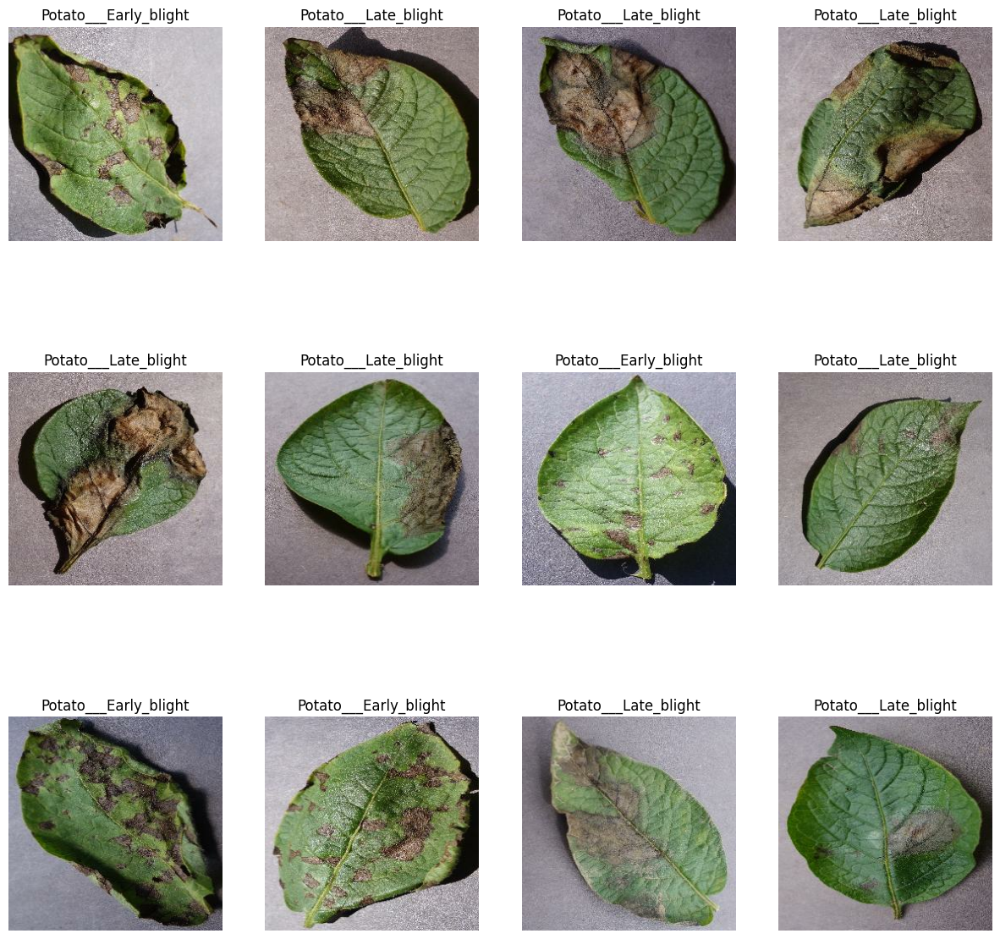

In [ ]:
# Plotting the image
plt.figure(figsize = (15,15))
# dataset.take(count) : Creates a Dataset with at most 'count' elements(batch) from the dataset
for image, label in dataset_2.take(1):
    for i in range(12):
        plt.subplot(3, 4, i+1) # many plots at a time =>subpots
        plt.imshow(image[i].numpy().astype('uint8')) #converting all data of image into numpy and than to intiger type as they were in float.
        plt.title(class_name[label[i]])  # title of the class_name of image
        plt.axis("off") # Hide the values of graph

###✈ show  image histogram and its channels

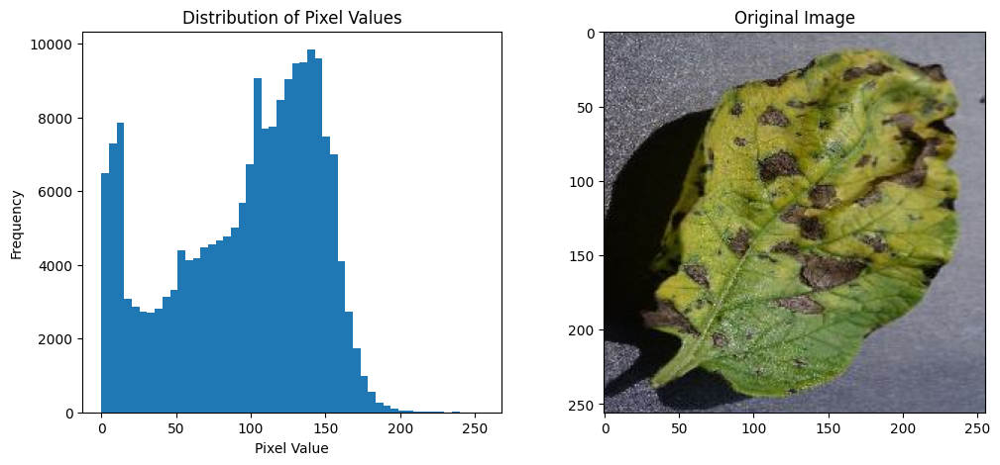

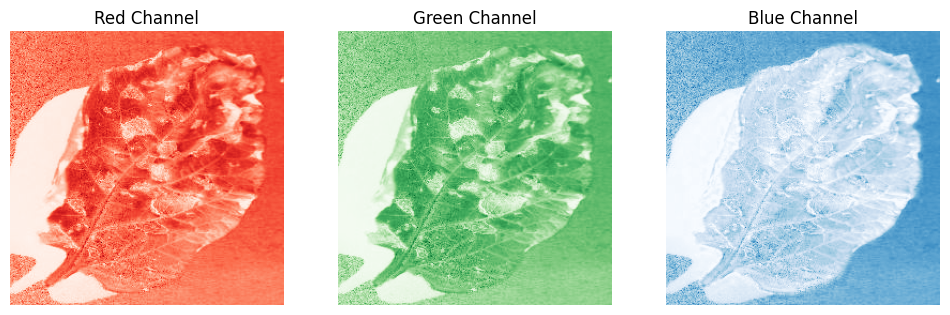

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

# Load a sample image from  dataset
for image, label in dataset_2.take(1):
    img_array = image.numpy()  # Convert to numpy array

# Select a single image from the batch to display
img_to_display = img_array[0]  # Select the first image (index 0)

# Flatten the image to a 1D array
img_flatten = img_to_display.flatten()

# Create a pandas Series from the flattened image
pixel_series = pd.Series(img_flatten)

# Plot the histogram of pixel values
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
pixel_series.plot(kind='hist', bins=50, title='Distribution of Pixel Values')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# Display the image and its channels
plt.subplot(1, 2, 2)
plt.imshow(img_to_display.astype("uint8"))  # Display the selected single image
plt.title('Original Image')

# Separate the channels
if img_to_display.shape[-1] == 3:  # Assuming the last dimension is the channel dimension
    img_red = img_to_display[:, :, 0]
    img_green = img_to_display[:, :, 1]
    img_blue = img_to_display[:, :, 2]

    plt.figure(figsize=(12, 4))

    # Display the Red channel
    plt.subplot(1, 3, 1)
    plt.imshow(img_red, cmap='Reds')
    plt.title('Red Channel')
    plt.axis('off')

    # Display the Green channel
    plt.subplot(1, 3, 2)
    plt.imshow(img_green, cmap='Greens')
    plt.title('Green Channel')
    plt.axis('off')

    # Display the Blue channel
    plt.subplot(1, 3, 3)
    plt.imshow(img_blue, cmap='Blues')
    plt.title('Blue Channel')
    plt.axis('off')

plt.show()


>>**When an image's histogram exhibits a well-distributed range of intensities, it typically indicates sufficient inherent contrast. In such cases, applying intensity transformation techniques like histogram equalization might not be necessary.**

## Extracting Pepper Dataset

In [ ]:
# Copy Pepper dataset
!cp -rf ../input/plant-village/PlantVillage/Pepper__bell___Bacterial_spot ./Pepper_Dataset/Pepper__bell___Bacterial_spot
!cp -rf ../input/plant-village/PlantVillage/Pepper__bell___healthy ./Pepper_Dataset/Pepper__bell___healthy


In [ ]:
# Define dataset directory path
dataset_dir = pathlib.Path('./Pepper_Dataset')  # Update this for different dataset groups

# Load the dataset
dataset_1 = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_dir, batch_size=Batch_Size, image_size=(Image_Size, Image_Size), shuffle=True
)

Found 4950 files belonging to 2 classes.


In [ ]:
# Get class names
class_name = dataset_1.class_names
print(class_name)

['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy']


In [ ]:
len(dataset_1)

155

In [ ]:
print(dataset_1)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


###✈ show some image

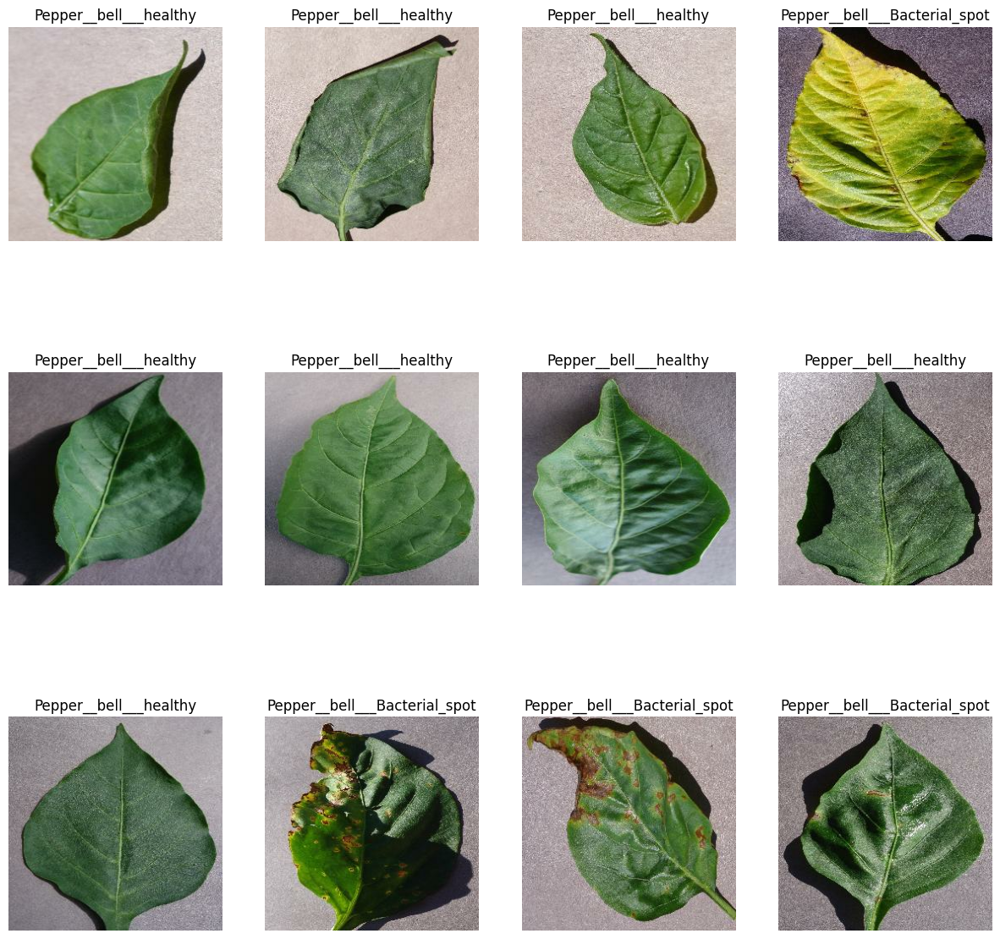

In [ ]:
# Plotting the image
plt.figure(figsize = (15,15))
# dataset.take(count) : Creates a Dataset with at most 'count' elements(batch) from the dataset
for image, label in dataset_1.take(1):
    for i in range(12):
        plt.subplot(3, 4, i+1) # many plots at a time =>subpots
        plt.imshow(image[i].numpy().astype('uint8')) #converting all data of image into numpy and than to intiger type as they were in float.
        plt.title(class_name[label[i]])  # title of the class_name of image
        plt.axis("off") # Hide the values of graph

###✈ show  image histogram and its channels

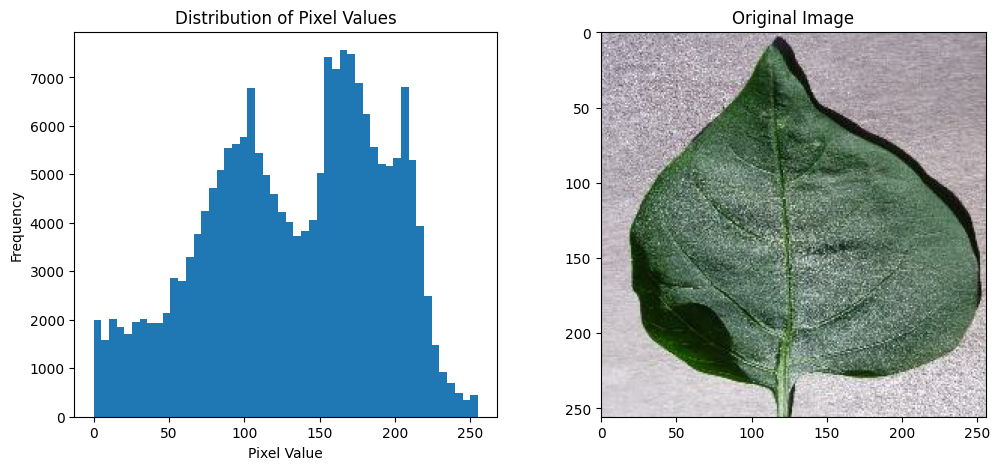

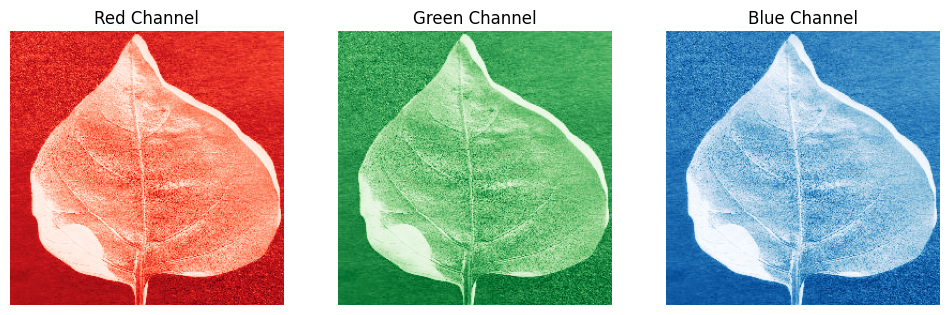

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

# Load a sample image from your dataset
for image, label in dataset_1.take(1):
    img_array = image.numpy()  # Convert to numpy array

# Select a single image from the batch to display
img_to_display = img_array[0]  # Select the first image (index 0)

# Flatten the image to a 1D array
img_flatten = img_to_display.flatten()

# Create a pandas Series from the flattened image
pixel_series = pd.Series(img_flatten)

# Plot the histogram of pixel values
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
pixel_series.plot(kind='hist', bins=50, title='Distribution of Pixel Values')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# Display the image and its channels
plt.subplot(1, 2, 2)
plt.imshow(img_to_display.astype("uint8"))  # Display the selected single image
plt.title('Original Image')

# Separate the channels
if img_to_display.shape[-1] == 3:  # Assuming the last dimension is the channel dimension
    img_red = img_to_display[:, :, 0]
    img_green = img_to_display[:, :, 1]
    img_blue = img_to_display[:, :, 2]

    plt.figure(figsize=(12, 4))

    # Display the Red channel
    plt.subplot(1, 3, 1)
    plt.imshow(img_red, cmap='Reds')
    plt.title('Red Channel')
    plt.axis('off')

    # Display the Green channel
    plt.subplot(1, 3, 2)
    plt.imshow(img_green, cmap='Greens')
    plt.title('Green Channel')
    plt.axis('off')

    # Display the Blue channel
    plt.subplot(1, 3, 3)
    plt.imshow(img_blue, cmap='Blues')
    plt.title('Blue Channel')
    plt.axis('off')

plt.show()


>>**When an image's histogram exhibits a well-distributed range of intensities, it typically indicates sufficient inherent contrast. In such cases, applying intensity transformation techniques like histogram equalization might not be necessary.**

## Extracting Tomato Dataset

In [ ]:
# Copy Tomato dataset
!cp -rf ../input/plant-village/PlantVillage/Tomato_Leaf_Mold ./Tomato_Dataset/Tomato_Leaf_Mold
!cp -rf ../input/plant-village/PlantVillage/Tomato__Tomato_YellowLeaf__Curl_Virus ./Tomato_Dataset/Tomato__Tomato_YellowLeaf__Curl_Virus
!cp -rf ../input/plant-village/PlantVillage/Tomato_Bacterial_spot ./Tomato_Dataset/Tomato_Bacterial_spot
!cp -rf ../input/plant-village/PlantVillage/Tomato_Septoria_leaf_spot ./Tomato_Dataset/Tomato_Septoria_leaf_spot
!cp -rf ../input/plant-village/PlantVillage/Tomato_healthy ./Tomato_Dataset/Tomato_healthy
!cp -rf ../input/plant-village/PlantVillage/Tomato_Spider_mites_Two_spotted_spider_mite ./Tomato_Dataset/Tomato_Spider_mites_Two_spotted_spider_mite
!cp -rf ../input/plant-village/PlantVillage/Tomato_Early_blight ./Tomato_Dataset/Tomato_Early_blight
!cp -rf ../input/plant-village/PlantVillage/Tomato__Target_Spot ./Tomato_Dataset/Tomato__Target_Spot
!cp -rf ../input/plant-village/PlantVillage/Tomato_Late_blight ./Tomato_Dataset/Tomato_Late_blight
!cp -rf ../input/plant-village/PlantVillage/Tomato__Tomato_mosaic_virus ./Tomato_Dataset/Tomato__Tomato_mosaic_virus

In [ ]:
# Define dataset directory path
dataset_dir = pathlib.Path('./Tomato_Dataset')  # Update this for different dataset groups

# Load the dataset
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_dir, batch_size=Batch_Size, image_size=(Image_Size, Image_Size), shuffle=True
)


Found 16011 files belonging to 10 classes.


In [ ]:
# Get class names
class_name = dataset.class_names
print(class_name)

['Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']


In [ ]:
len(dataset) # Number of Batches = (total number of files belonging to all classes / Batch_Size)

501

In [ ]:
print(dataset) #prints Elements in dataset: here 1st element is image and 2nd index of that image.

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


###✈ show some image

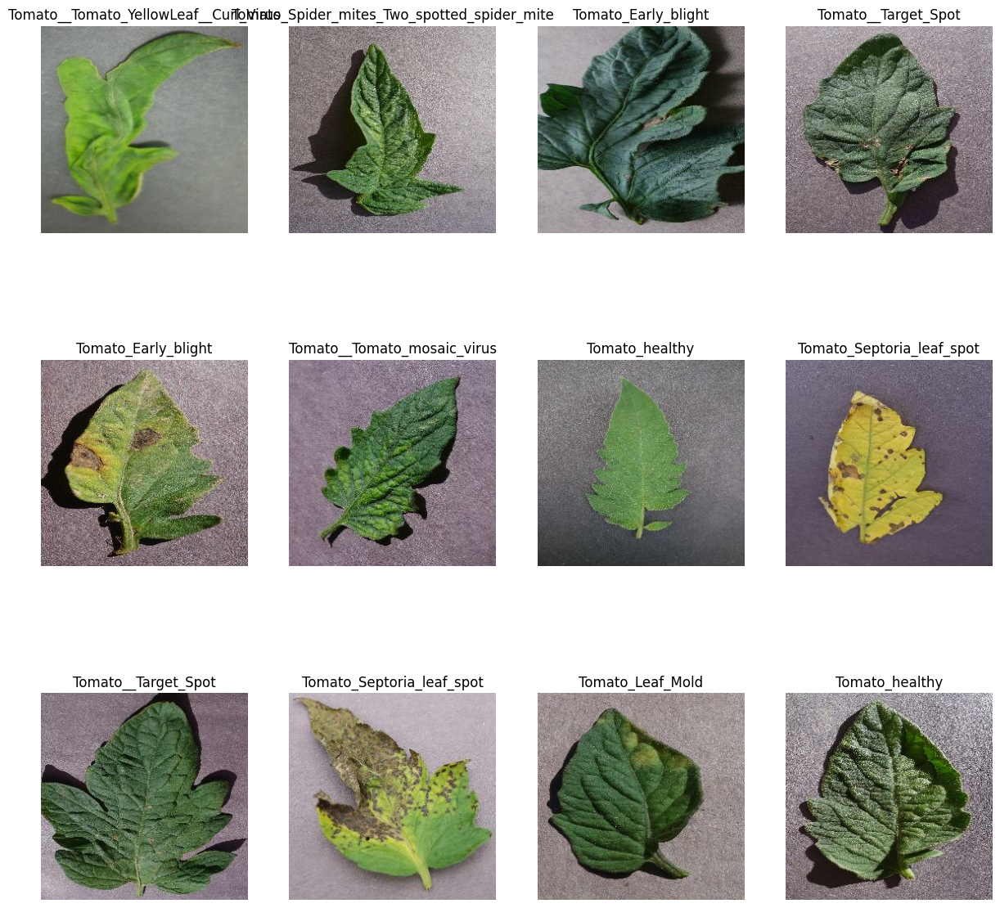

In [ ]:
# Plotting the image
plt.figure(figsize = (15,15))
# dataset.take(count) : Creates a Dataset with at most 'count' elements(batch) from the dataset
for image, label in dataset.take(1):
    for i in range(12):
        plt.subplot(3, 4, i+1) # many plots at a time =>subpots
        plt.imshow(image[i].numpy().astype('uint8')) #converting all data of image into numpy and than to intiger type as they were in float.
        plt.title(class_name[label[i]])  # title of the class_name of image
        plt.axis("off") # Hide the values of graph

###✈ show  image histogram and its channels

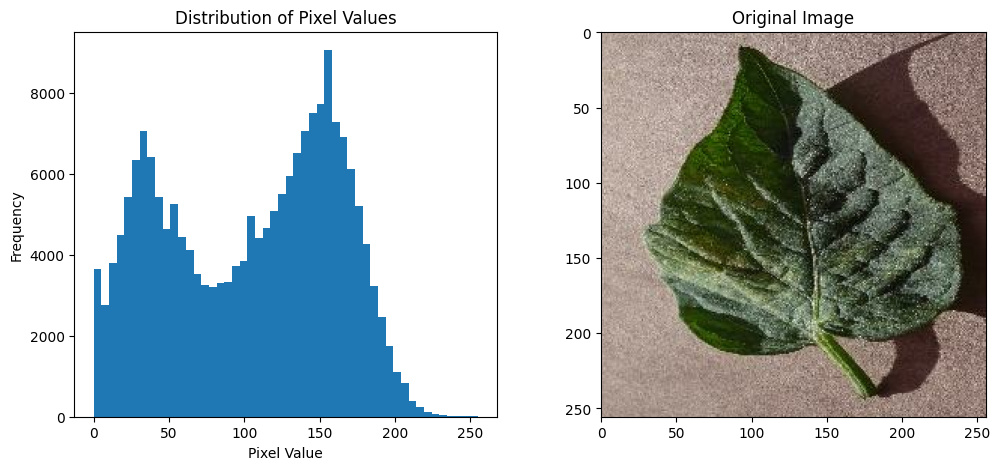

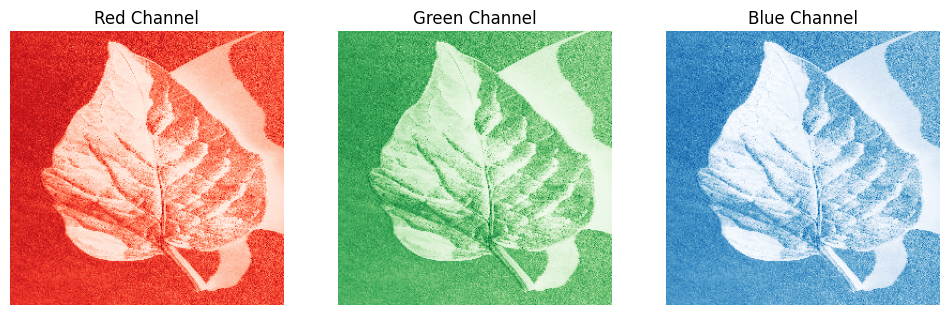

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

# Load a sample image from your dataset
for image, label in dataset.take(1):
    img_array = image.numpy()  # Convert to numpy array

# Select a single image from the batch to display
img_to_display = img_array[0]  # Select the first image (index 0)

# Flatten the image to a 1D array
img_flatten = img_to_display.flatten()

# Create a pandas Series from the flattened image
pixel_series = pd.Series(img_flatten)

# Plot the histogram of pixel values
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
pixel_series.plot(kind='hist', bins=50, title='Distribution of Pixel Values')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# Display the image and its channels
plt.subplot(1, 2, 2)
plt.imshow(img_to_display.astype("uint8"))  # Display the selected single image
plt.title('Original Image')

# Separate the channels
if img_to_display.shape[-1] == 3:  # Assuming the last dimension is the channel dimension
    img_red = img_to_display[:, :, 0]
    img_green = img_to_display[:, :, 1]
    img_blue = img_to_display[:, :, 2]

    plt.figure(figsize=(12, 4))

    # Display the Red channel
    plt.subplot(1, 3, 1)
    plt.imshow(img_red, cmap='Reds')
    plt.title('Red Channel')
    plt.axis('off')

    # Display the Green channel
    plt.subplot(1, 3, 2)
    plt.imshow(img_green, cmap='Greens')
    plt.title('Green Channel')
    plt.axis('off')

    # Display the Blue channel
    plt.subplot(1, 3, 3)
    plt.imshow(img_blue, cmap='Blues')
    plt.title('Blue Channel')
    plt.axis('off')

plt.show()


>>**When an image's histogram exhibits a well-distributed range of intensities, it typically indicates sufficient inherent contrast. In such cases, applying intensity transformation techniques like histogram equalization might not be necessary.**

### Combined Dataset

In [ ]:
import os

# Create a combined dataset directory
combined_dataset_dir = './Combined_Dataset'
os.makedirs(combined_dataset_dir, exist_ok=True)

# Copy the datasets into the combined directory
!cp -rf ./Pepper_Dataset/* ./Combined_Dataset/
!cp -rf ./Potato_Dataset/* ./Combined_Dataset/
!cp -rf ./Tomato_Dataset/* ./Combined_Dataset/


In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np
import pathlib


# Define the combined dataset directory path
dataset_dir = pathlib.Path('./Combined_Dataset')

# Load the combined dataset
dataset_final = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_dir, batch_size=Batch_Size, image_size=(Image_Size, Image_Size), shuffle=True
)

Found 41276 files belonging to 15 classes.


In [ ]:
# Get class names
class_name = dataset_final.class_names
print(class_name)

['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']


## I will try to predict only on  Tomato dataset

## Splitting Dataset

In [ ]:
# Function for Splitting the data
def split_dataset(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed = 10)

    ds_size = len(ds)
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

**Why i split data in 3 sets:**

>In general, using training, validation, and test sets provides a more robust approach to model evaluation and tuning. It helps in better model selection, hyperparameter tuning, and ensures that the final evaluation metrics are unbiased. However, the specific choice of data splitting strategy should consider the size of the dataset and the goals of the analysis.

In [ ]:
train_data, val_data, test_data = split_dataset(dataset)

In [ ]:
print("Size of Data is :{0} \nBatch size of Training Data is :{1}\nBatch size of Validation Data is :{2} \nBatch size of Testing Data is :{3} " .format(len(dataset), len(train_data), len(val_data), len(test_data)))

Size of Data is :501 
Batch size of Training Data is :400
Batch size of Validation Data is :50 
Batch size of Testing Data is :51 


In [ ]:
train_data, val_data, test_data = split_dataset(dataset_final)

In [ ]:
# caching,shuffle and prefetching the data
train_ds = train_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)
val_ds = val_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)
test_ds = test_data.cache().shuffle(100).prefetch(buffer_size = tf.data.AUTOTUNE)


* **Caching:** reduces the overhead of reading data from disk.
* **Shuffling:**ensures the data order is randomized, which helps in better generalization during training.
* **Prefetching:** overlaps data loading with model training, making the training loop faster.

# Data Pre-processing

In [ ]:
# Image Preprocessing : Rescaling and Resizing
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(Image_Size, Image_Size),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

**Resizing:**

>Neural networks generally require input images to be of a fixed size. Resizing ensures that all images have the same dimensions, which is a requirement for many model architectures.
It also helps in managing memory and computational requirements by standardizing the input size.
>
**Rescaling:**

>Neural networks perform better when input values are normalized to a small range. By rescaling pixel values to the [0, 1] range, the model can more effectively learn patterns in the data. also help in achieving faster convergence during training.


In [ ]:
# Data augmentation by flipping and rotating existing images
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip(mode="horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(factor = 0.5)
])

**Random Flipping:**
> Adds variations by flipping images horizontally, vertically, or both.
 This augmentation helps in increasing the variety in your training data by creating mirror images of the original images. This can improve the model’s ability to generalize by making it less sensitive to the orientation of objects in images.
 >
**Random Rotation:**
>Adds variability by rotating images within a specified range.
This augmentation helps the model learn to recognize objects from different angles, making it more robust to variations in the orientation of objects in real-world scenarios.

# Model Building

In [ ]:
#Global initialization of some imp variables
Image_Size = 256
Batch_Size = 32 ##the number of samples (images) that are processed togethe
Channels = 3
Epochs = 40


In [ ]:
# Creating Convolution layer
input_shape = (Batch_Size, Image_Size, Image_Size, Channels)
model = models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(filters = 16, kernel_size = (3,3), activation = 'relu', input_shape = input_shape),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(128, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(128, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Conv2D(64, (3,3), activation = 'relu'),
    layers.MaxPool2D((2,2)),
    layers.Flatten(),
    layers.Dense(128, activation = 'relu'),
    layers.Dense(64, activation = 'softmax'),

])


model.build(input_shape = input_shape)

Summary
>
* **Convolutional Layers:** Extract features from the input images.
* **MaxPooling Layers:** Reduce the spatial dimensions of the feature maps.
* **Flatten Layer:** Converts the 2D feature maps into a 1D vector.
* **Dense Layers:** Classifies the flattened features into the desired output classes.

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (32, 127, 127, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        9280      
                                                                 
 max_pooling2d_1 (MaxPoolin  (32, 62, 62, 64)          0         
 g2D)                                                 

In [ ]:
# Optimizing the model 'SparseCategoricalCrossentropy'=>as there are many categorical classes of data
model.compile(
    optimizer = 'adam',
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = False),
    metrics = ['accuracy'])

**Info  about  adam  optimizer:**
>
>* How it works: Uses moving averages of both gradients and squared gradients to adaptively adjust learning rates for each parameter.
* Pros: Often converges faster and requires less tuning. Works well in practice for a variety of problems.
* Cons: Can be less effective on very noisy problems or with very large datasets.

**The loss function**
> measures how well the model's predictions match the true labels. Here, SparseCategoricalCrossentropy is used because the problem involves multiple classes, and the labels are integers (not one-hot encoded vectors).

**Metrics** are used to monitor the performance of the model during training and evaluation. Here, accuracy is used, which measures the proportion of correct predictions out of all predictions made. It’s a commonly used metric for classification problems.

In [ ]:
#Fit the model with training data and also pass validation data
history = model.fit(
train_data, epochs = Epochs, batch_size = Batch_Size, verbose = 1, validation_data = val_data)

Epoch 1/40
400/400 [==============================] - 167s 410ms/step - loss: 1.9625 - accuracy: 0.2870 - val_loss: 2.1621 - val_accuracy: 0.3094
Epoch 2/40
400/400 [==============================] - 163s 404ms/step - loss: 1.2573 - accuracy: 0.5630 - val_loss: 1.6110 - val_accuracy: 0.4906
Epoch 3/40
400/400 [==============================] - 162s 402ms/step - loss: 0.8848 - accuracy: 0.6941 - val_loss: 1.0193 - val_accuracy: 0.6419
Epoch 4/40
400/400 [==============================] - 162s 401ms/step - loss: 0.7090 - accuracy: 0.7476 - val_loss: 1.5627 - val_accuracy: 0.5688
Epoch 5/40
400/400 [==============================] - 160s 398ms/step - loss: 0.5910 - accuracy: 0.7922 - val_loss: 1.2582 - val_accuracy: 0.6350
Epoch 6/40
400/400 [==============================] - 159s 394ms/step - loss: 0.5256 - accuracy: 0.8128 - val_loss: 0.9356 - val_accuracy: 0.7138
Epoch 7/40
400/400 [==============================] - 160s 397ms/step - loss: 0.4371 - accuracy: 0.8460 - val_loss: 0.7059 -

**verbose:**

>Controls the verbosity of the training output.
* verbose = 1: Displays a progress bar showing the training progress.
* verbose = 2: Displays one line per epoch.
*verbose = 0: Suppresses all output.

**validation_data:**
>The validation dataset used to evaluate the model at the end of each epoch.
Helps to monitor the model’s performance on unseen data and helps to tune hyperparameters or prevent overfitting.

In [ ]:
scores = model.evaluate(train_data)

400/400 [==============================] - 33s 80ms/step - loss: 0.1300 - accuracy: 0.9548


In [ ]:
history

In [ ]:
history.params

{'verbose': 1, 'epochs': 40, 'steps': 400}

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

# Analyzing the Output

In [ ]:
# Getting the model history to analyse
train_loss = history.history['loss']
train_acc = history.history['accuracy']

val_loss = history.history['val_loss']
val_acc = history.history['val_accuracy']


Text(0.5, 1.0, 'Training and Validation Loss')

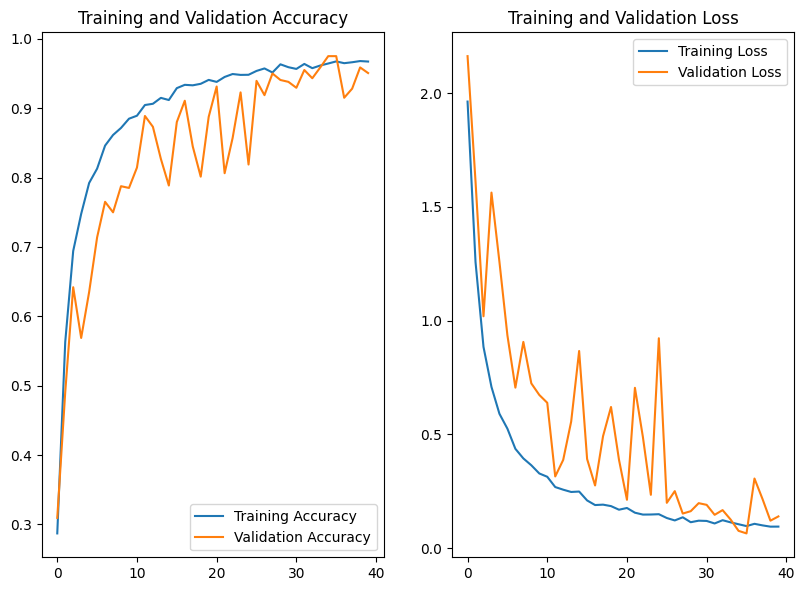

In [ ]:
#graphs for accuracy and loss of training and validation data
plt.figure(figsize = (15,15))
plt.subplot(2,3,1)
plt.plot(range(Epochs), train_acc, label = 'Training Accuracy')
plt.plot(range(Epochs), val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2,3,2)
plt.plot(range(Epochs), train_loss, label = 'Training Loss')
plt.plot(range(Epochs), val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation Loss')

First Image of batch to predict :
Actual label :  Tomato_Early_blight
1/1 [==============================] - 0s 403ms/step
Predicted label :  Tomato_Early_blight


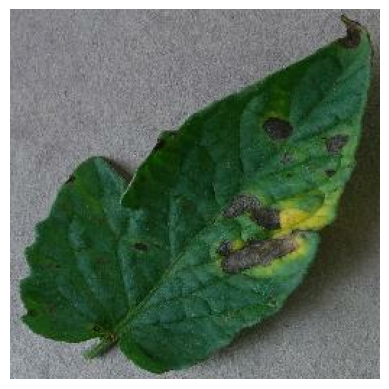

In [ ]:
#plotting image
for batch_image, batch_label in train_data.take(1):
    first_image = batch_image[0].numpy().astype('uint8')
    first_label = class_name[batch_label[0]]

    print('First Image of batch to predict :')
    plt.imshow(first_image)
    print('Actual label : ', first_label)

    batch_prediction = model.predict(batch_image)
    print('Predicted label : ', class_name[np.argmax(batch_prediction[0])])
    plt.axis('off')

### Plotting  images with its actual label, predicted label

1/1 [==============================] - 0s 97ms/step


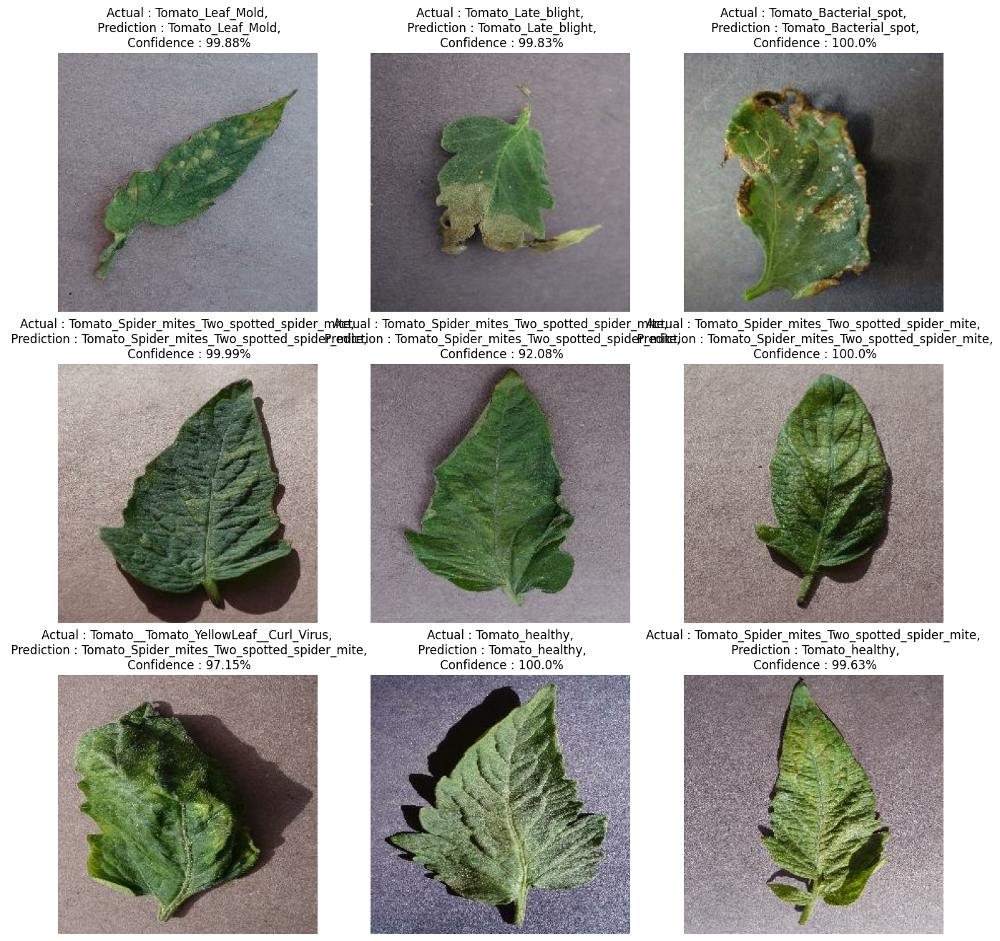

In [ ]:
# plotting batch of images with its actual label, predicted label and confidence
plt.figure(figsize = (16,16))
for batch_image, batch_label in train_data.take(1):
    for i in range(9):
        ax = plt.subplot(3,3,i+1)
        image = batch_image[i].numpy().astype('uint8')
        label = class_name[batch_label[i]]

        plt.imshow(image)

        batch_prediction = model.predict(batch_image)
        predicted_class = class_name[np.argmax(batch_prediction[i])]
        confidence = round(np.max(batch_prediction[i]) * 100, 2)

        plt.title(f'Actual : {label},\n Prediction : {predicted_class},\n Confidence : {confidence}%')

        plt.axis('off')